In [1]:
import sys; sys.path.insert(0,'..')
from hashstash import *
logger.setLevel(logging.INFO)
from hashstash.profilers.engine_profiler import *
import plotnine as p9
import pandas as pd
p9.options.dpi = 300
p9.options.figure_size = (8, 7)

Profiling 168 stashes: 100%|██████████| 168/168 [00:02<00:00, 57.32it/s] 


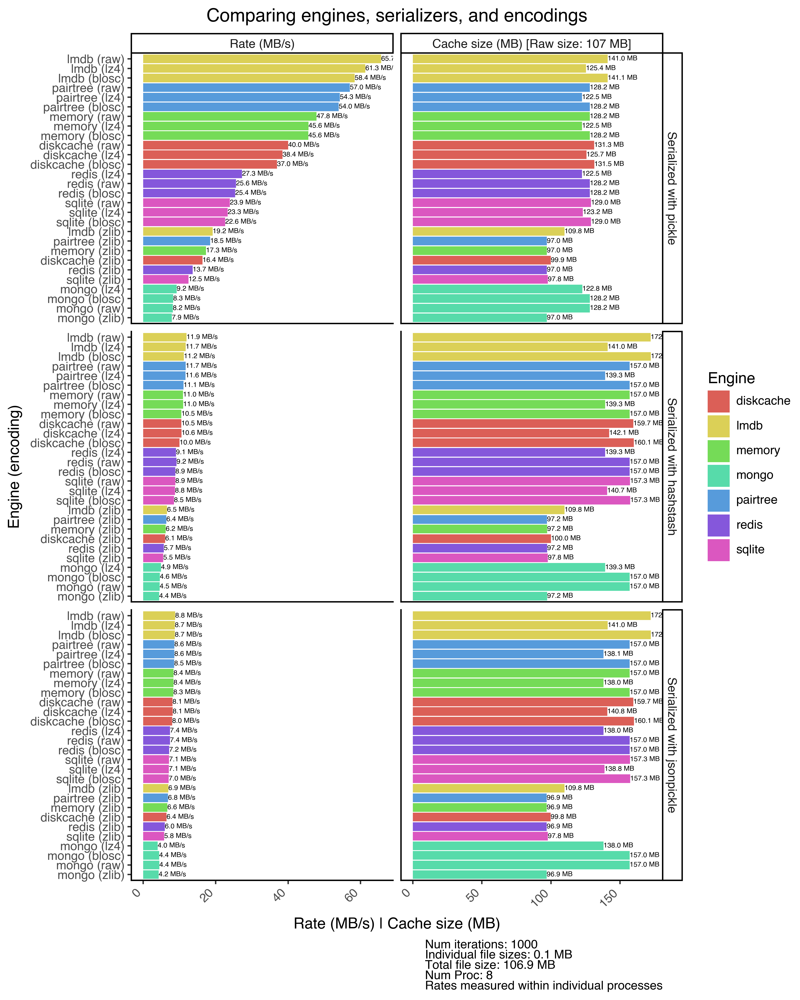

In [2]:
HashStashProfiler.plot_all()

In [2]:
df=HashStashProfiler.run_profiles(**opts_all)
df['Rate (it/s)'] = 1 / (df['Set Time (s)'] + df['Get Time (s)'])
df['Rate (MB/s)'] = df['Raw Size (B)'] / (df['Set Time (s)'] + df['Get Time (s)']) / 1024 / 1024
df['Label'] = df['Engine'] + ' + ' + (df['Encoding'].str.replace('+b64',''))
df['Filesize (MB)'] = df['Filesize (B)'] / 1024 / 1024
df.columns

Profiling 168 stashes: 100%|██████████| 168/168 [00:02<00:00, 62.78it/s] 


Index(['Iteration', 'Engine', 'Serializer', 'Encoding', 'Data Type',
       'Num Proc', 'Size (B)', 'Raw Size (B)', 'Serialize Time (s)',
       'Serialized Size (B)', 'Encode Time (s)', 'Encoded Size (B)',
       'Set Time (s)', 'Get Time (s)', 'Decode Time (s)',
       'Deserialize Time (s)', 'Filesize (B)', 'Rate (it/s)', 'Rate (MB/s)',
       'Label', 'Filesize (MB)'],
      dtype='object')

,Engine,Serializer,Encoding,Label,Rate (MB/s),Filesize (MB),Size Ratio
16,lmdb,jsonpickle,blosc+b64,lmdb + blosc,8.736725,172.304688,1.612113
12,lmdb,hashstash,blosc+b64,lmdb + blosc,11.228804,172.304688,1.612113
14,lmdb,hashstash,raw+b64,lmdb + raw,11.925030,172.289062,1.611967
18,lmdb,jsonpickle,raw+b64,lmdb + raw,8.812574,172.273438,1.611821
4,diskcache,jsonpickle,blosc+b64,diskcache + blosc,8.009805,160.120850,1.498119
...,...,...,...,...,...,...,...
59,pairtree,pickle,zlib+b64,pairtree + zlib,18.460641,96.988678,0.907443
31,memory,jsonpickle,zlib+b64,memory + zlib,6.642775,96.857208,0.906213
67,redis,jsonpickle,zlib+b64,redis + zlib,5.967214,96.857151,0.906213
43,mongo,jsonpickle,zlib+b64,mongo + zlib,4.248222,96.857113,0.906212


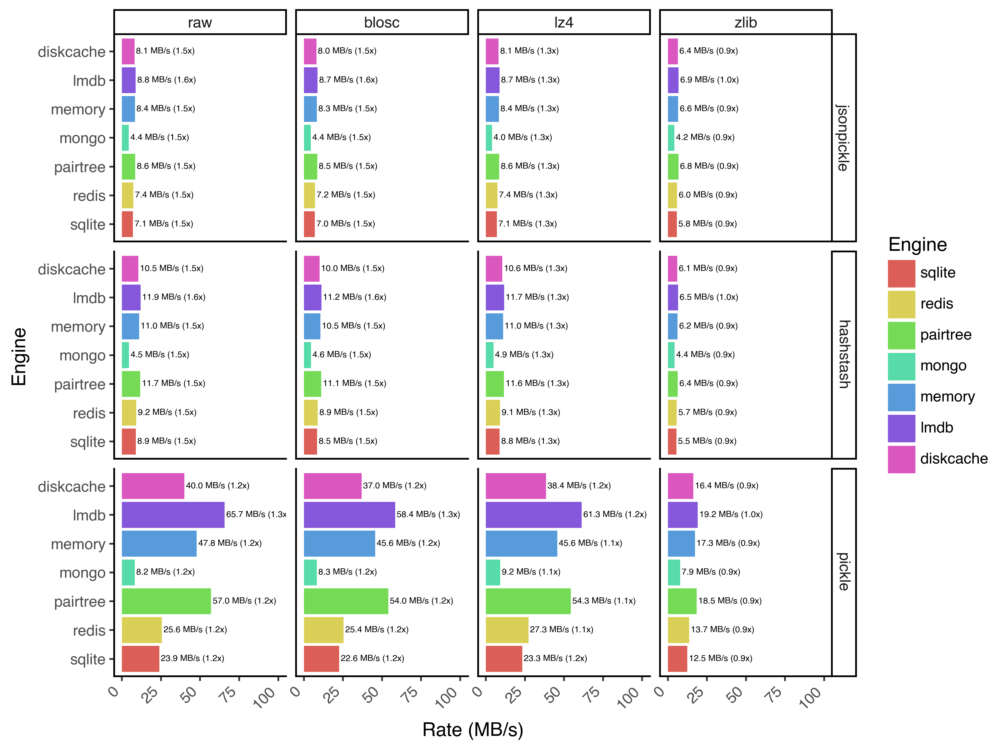

In [15]:
import plotnine as p9
import pandas as pd
p9.options.figure_size = (8, 6)
rawsize = df.groupby('Iteration')['Raw Size (B)'].median().sum() / 1024 / 1024

figdf = df.groupby(['Engine','Serializer','Encoding','Label']).agg({'Rate (MB/s)': 'median', 'Filesize (MB)': 'last'}).reset_index()
figdf['Size Ratio'] = figdf['Filesize (MB)'] / rawsize
figdf.sort_values('Size Ratio', ascending=False)

# figdf = figdf.sort_values(['Serializer','Rate (MB/s)'], ascending=[True,True])
figdf['Encoding'] = figdf.Encoding.str.replace('+b64','')
figdf['Encoding'] = pd.Categorical(figdf['Encoding'], categories=['raw','blosc','lz4','zlib'])
figdf['Serializer'] = pd.Categorical(figdf['Serializer'], categories=['jsonpickle','hashstash', 'pickle'])
figdf['Engine'] = pd.Categorical(figdf['Engine'], categories=sorted(figdf.Engine.unique(), reverse=True))
figdf['Label'] = pd.Categorical(figdf['Label'], categories=figdf['Label'].unique())
fig=p9.ggplot(figdf, p9.aes(x='Engine', y='Rate (MB/s)', fill='Engine')) + p9.geom_bar(stat='identity') + p9.theme_classic() + p9.theme(axis_text_x=p9.element_text(angle=45, hjust=1)) + p9.coord_flip()
# Create a color gradient from red to blue based on filesize
# fig += p9.scale_fill_gradient(low='lightblue', high='red')
figdf['bar_label'] = figdf['Rate (MB/s)'].apply(lambda x: f'{x:.1f} MB/s')
figdf['bar_label'] += figdf['Size Ratio'].apply(lambda x: f' ({x:.1f}x)')
# fig+=p9.geom_text(p9.aes(label='bar_label',color="Serializer"), size=6, nudge_y=5)
fig+=p9.geom_text(p9.aes(label='bar_label'), size=5, nudge_y=1, ha='left', color='black')
# fig+=p9.facet_wrap('Serializer')
fig+=p9.facet_grid('Serializer ~ Encoding')
fig+=p9.scale_y_continuous(limits=(0,100))
# fig+=p9.scale_fill_gradient(low='blue', high='red')
fig

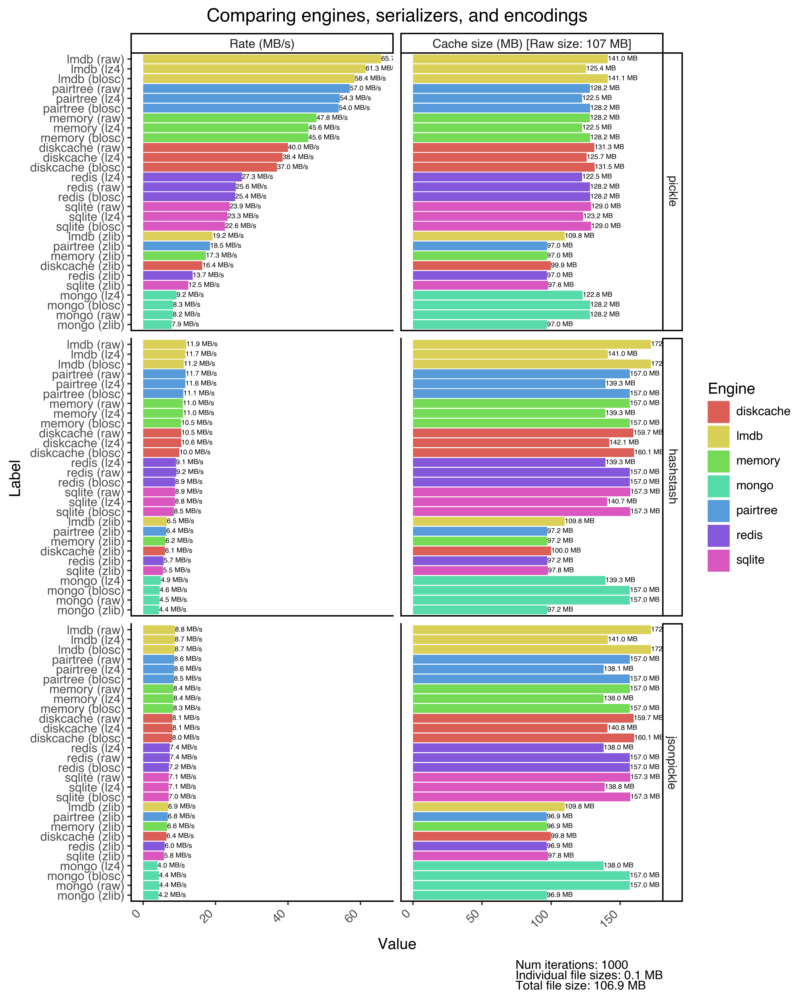

In [70]:
p9.options.figure_size = (8, 10)
df['Label'] = df['Engine'] + ' (' + (df['Encoding'].str.replace('+b64','')) + ')'
rawsize = df.groupby('Iteration')['Raw Size (B)'].median().sum() / 1024 / 1024

filesizekey=f'Cache size (MB) [Raw size: {rawsize:.0f} MB]'

figdf = df.groupby(['Engine','Serializer','Encoding','Label']).agg({'Rate (MB/s)': 'median', 'Filesize (MB)': 'last'}).reset_index()
figdf['Size Ratio'] = figdf['Filesize (MB)'] / rawsize
figdf[filesizekey] = figdf['Filesize (MB)']
figdf2=figdf.melt(id_vars=['Engine','Serializer','Encoding','Label'], value_vars=['Rate (MB/s)',filesizekey], var_name='Metric', value_name='Value')
figdf2['Serializer'] = pd.Categorical(figdf2['Serializer'], categories=['pickle','hashstash', 'jsonpickle'])
figdf2['Metric'] = pd.Categorical(figdf2['Metric'], categories=['Rate (MB/s)',filesizekey])
figdf2.sort_values(['Metric','Serializer','Value'], ascending=[True,True,True], inplace=True)
figdf2['Label'] = pd.Categorical(figdf2['Label'], categories=figdf2['Label'].unique())
fig=p9.ggplot(figdf2, p9.aes(x='Label', y='Value', fill='Engine')) + p9.geom_bar(stat='identity') + p9.theme_classic() + p9.theme(axis_text_x=p9.element_text(angle=45, hjust=1)) + p9.coord_flip()
figdf2['bar_label'] = figdf2.apply(lambda row: f'{row["Value"]:.1f} MB/s' if row["Metric"] == 'Rate (MB/s)' else f'{row["Value"]:.1f} MB', axis=1)
fig+=p9.geom_text(p9.aes(label='bar_label'), size=5, ha='left', color='black')
fig+=p9.facet_grid('Serializer ~ Metric', scales='free')
fig+=p9.labs(
    title='Comparing engines, serializers, and encodings',
    caption=f'Num iterations: {df.Iteration.nunique()}\nIndividual file sizes: {df.groupby("Iteration")["Raw Size (B)"].median().mean() / 1024 / 1024:.1f} MB\nTotal file size: {rawsize:.1f} MB',
)
fig


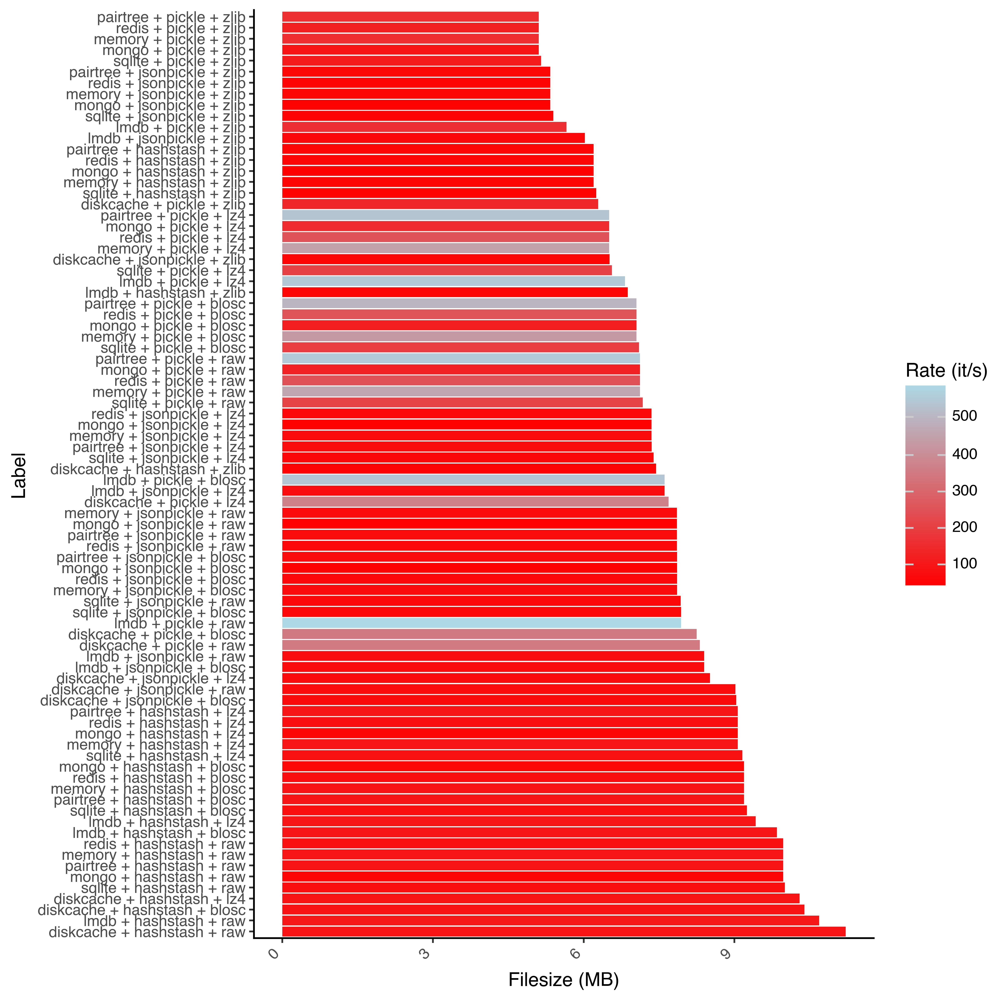

In [89]:
import plotnine as p9
import pandas as pd
p9.options.figure_size = (8, 8)
figdf = df.groupby('Label').median(numeric_only=True).reset_index()
figdf = figdf.sort_values('Filesize (MB)', ascending=False)
figdf['Label'] = pd.Categorical(figdf['Label'], categories=figdf['Label'].unique())
fig=p9.ggplot(figdf, p9.aes(x='Label', y='Filesize (MB)', fill='Rate (it/s)')) + p9.geom_bar(stat='identity') + p9.theme_classic() + p9.theme(axis_text_x=p9.element_text(angle=45, hjust=1)) + p9.coord_flip()
# Create a color gradient from red to blue based on filesize
fig += p9.scale_fill_gradient(low='red', high='lightblue')

fig

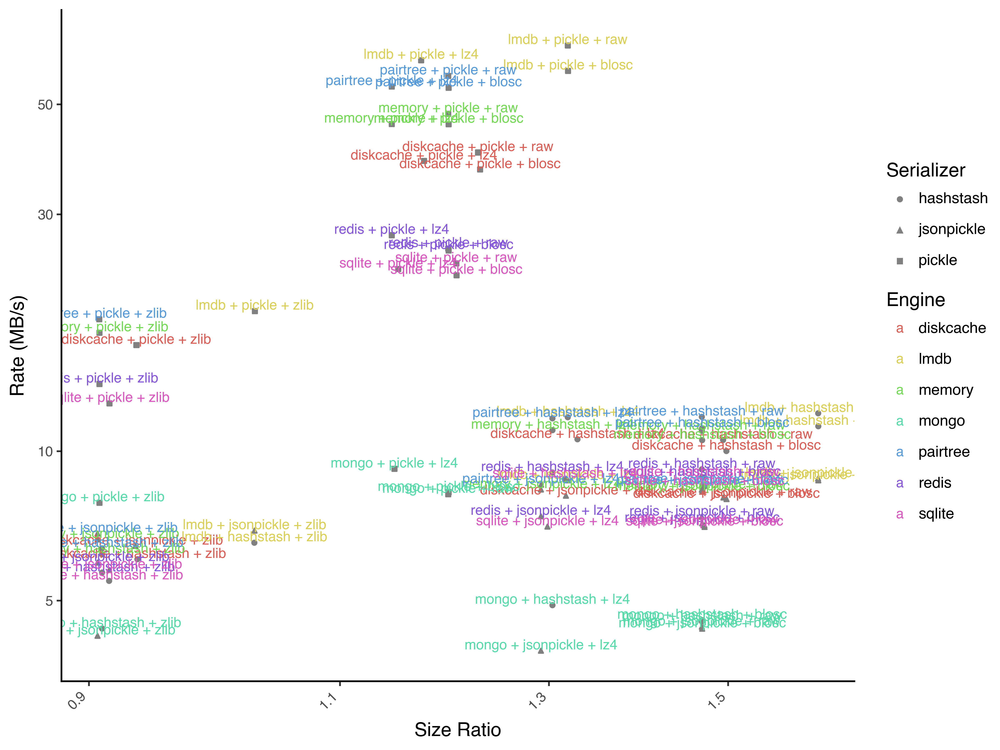

In [19]:
figdf = df.groupby(['Engine','Serializer','Encoding']).agg({'Rate (MB/s)': 'median', 'Filesize (MB)': 'last'}).reset_index()
# figdf=figdf[figdf.Serializer!="pickle"]
# figdf=figdf[figdf.Engine!="memory"]
figdf['Label'] = figdf['Engine'] + ' + ' + figdf['Serializer'] + ' + ' + (figdf['Encoding'].str.replace('+b64',''))
figdf['Size Ratio'] = figdf['Filesize (MB)'] / rawsize
# figdf=figdf[figdf.Engine!="dataframe"]
# figdf=figdf[figdf.Encoding.isin({"lz4+b64","raw+b64"})]
fig=p9.ggplot(figdf, p9.aes(y='Rate (MB/s)', x='Size Ratio', label='Label'))
# fig+=p9.geom_smooth(method='loess', alpha=.1, size=.5)
fig+=p9.geom_point(p9.aes(shape='Serializer'), size=1, color='gray')
fig+=p9.geom_text(p9.aes(color='Engine'), size=8, nudge_y=.01)
fig+=p9.theme_classic()
fig+=p9.labs()
fig+=p9.theme(axis_text_x=p9.element_text(angle=45, hjust=1, size=8), axis_text_y=p9.element_text(size=8))
# fig+=p9.scale_y_continuous(limits=(0,35))
# fig+=p9.scale_x_continuous(limits=(0,35))
# fig+=p9.facet_wrap('Serializer')
fig+=p9.scale_y_log10()
fig+=p9.scale_x_log10()
# fig += p9.geom_abline(slope=1, intercept=0, linetype='dashed', color='gray')
fig